In [1]:
from __future__ import print_function
from __future__ import absolute_import
from __future__ import division



from keras.regularizers import l2
from keras.engine.topology import get_source_inputs

import keras.backend as KB

import pickle
import numpy as np 
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
import random

import keras as K
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras

import matplotlib.pyplot as plt

plt.switch_backend('agg')

import cv2
from keras.utils.vis_utils import plot_model
from IPython.display import Image, display

from PIL import Image



/home/rajat/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [4]:
# img=cv2.imread('HighwayDriving/images/TrainSeq00_RGB_Image_0000.png',1)

# plt.imshow(img)
# plt.show()
# print(img.shape)
# img[:,0:100,:]=0
# img[:,980:1080,:]=0
# plt.imshow(img)

In [2]:
class HighwayDataset:
    def imread(self,name):
        img= cv2.cvtColor(cv2.imread(name) , cv2.COLOR_RGB2BGR)
        return img
    
    def imread_permanence(self , name):
        img= cv2.cvtColor(cv2.imread(name) , cv2.COLOR_RGB2BGR)
        img[:,0:100,:]=0
        img[:,980:1080,:]=0
        return img

    def image2class(self , image):
        img = np.zeros((image.shape[0],image.shape[1]))
        for i,t in enumerate(self.color_list):
            img[np.all(image == t[0] , axis = -1)] = i
        return img

    def class2onehot(self , classm):
        return (np.arange(self.nb_classes) == classm[...,None]).astype(np.int8)

    def class2image(self , classm):
        img = np.zeros((classm.shape[0],classm.shape[1],3))
        for i,t in enumerate(self.color_list):
            img[classm == i] = np.array(t[0])
        return img.astype(np.uint8)

    def image_file(self , name):
        return self.images_dir+'/'+name
    
    def label_file_segmentation(self , name):
        return self.labels_dir+'/'+(name.split('.')[0]).split('_')[0]+self.label_suffix + (name.split('.')[0]).split('_')[3]+'.png'
  

    def label_file(self , name):
#         print(self.labels_dir+'/'+(name.split('.')[0]).split('_')[0]+self.label_suffix + (name.split('.')[0]).split('_')[2]+'.png')
        return self.labels_dir+'/'+(name.split('.')[0]).split('_')[0]+self.label_suffix + (name.split('.')[0]).split('_')[2]+'.png'
  
    def __init__(self ,images_dir , labels_dir , classes = None):
        self.color_list =   [           
                                            ([0,0,0]          , 'Void'),
                                            ([0, 0, 128]      , 'Car'),
                                            ([255, 0 , 0]     , 'Fence'),
                                            ([128, 128, 128]  , 'Road'),
                                            ([0,255,255]      , 'Sky'),
                                            ([255,0,128]      , 'Traffic Sign'),
                                            ([0, 128, 0]      , 'Vegetation'),
                                            ([255,255,0]      , 'Lane'),
                                            ([128,0,128]      , 'Construction'),
                                            ([0,128,128]      , 'Truck'),
                                            ([255,255,255]    , 'Unknown')
                                        ]

        if classes is not None:
            assert(isinstance(classes,list) ) ,"log:give a list of classes, check dataset or code"
            color_list = [self.color_list[0]]
            for t in self.color_list[1:]:
                if t[1] in classes:
                    color_list.append(t)
            self.color_list = color_list

        self.nb_classes  = len(self.color_list)   
        print("log: after filtering there are ",self.nb_classes," classes for training")                          


        image_name_list = os.listdir(images_dir)
        list.sort(image_name_list)
        labels_name_list = os.listdir(labels_dir)
        self.split_char = '_'
        self.label_suffix= '_ColorLabel_'
        
        image_sequence_dict = {}

        for name in image_name_list:          
            n = (name.split(self.split_char))[0]
            image_sequence_dict.setdefault(n , [])
            image_sequence_dict[n].append(name)

        self.images_dir = 'HighwayDriving/images'
        self.labels_dir = 'HighwayDriving/labels'
        self.image_name_list = image_name_list
        self.labels_name_list = labels_name_list
        self.image_sequence_dict = image_sequence_dict
        
#         print(image_sequence_dict)     
    
    
    def frame2label_train_datagen(self ,size = None  ,  batch_size = 16 , validation = True , normalise = True):
        
        train_images = self.image_name_list
        
        if validation == True:
            train_images = self.image_name_list[:int(len(self.image_name_list)*0.9)]

        random.shuffle(train_images)
        itr = len(train_images) // batch_size 
        for i in range(itr+1):
            
            IMAGES = []
            LABELS = []
            beg = i*batch_size
            end = (i*batch_size + batch_size) if (i*batch_size + batch_size) < len(train_images) else -1
            for img_file in train_images[beg:end]:
                image = self.imread(self.image_file(img_file))
                label = self.image2class(self.imread(self.label_file_segmentation(img_file)))                 
                
                if size != None:
                    assert( len(size) == 2) , "log: give (y , x) format size"
                    image = cv2.resize(image , size , interpolation = cv2.INTER_NEAREST)
                    label = cv2.resize(label , size , interpolation = cv2.INTER_NEAREST) 
                    
                label = self.class2onehot(label)
                IMAGES.append(image)
                LABELS.append(label)
            IMAGES = np.array(IMAGES)
            LABELS = np.array(LABELS)
            if normalise:
                IMAGES = IMAGES/255

            yield np.array(IMAGES),np.array(LABELS)
        
    def jaccard_index(y_pred , y):
        intersection = np.logical_and(y, y_pred)
        union = np.logical_or(y, y_pred)
        iou_score = np.sum(intersection) / np.sum(union)
        return iou_score


    def get_class_weights(self , c=1.02):
        _ , labels = next(self.frame2label_train_datagen(size = (256 , 256)  ,  batch_size = len(self.image_name_list), validation = False , normalise = False))
        labels = np.argmax(labels , axis = -1)
        print(labels.shape)
        all_labels = labels.flatten()
        each_class = np.bincount(all_labels, minlength=self.nb_classes)
        prospensity_score = each_class / len(all_labels)
        class_weights = 1 / (np.log(c + prospensity_score))
        return class_weights
        
    def frame2futurelabel_test_datagen(self , size=None , batch_size = 16 , time_step = 1 , normalise = True):
#         assert(batch_size > time_step) ,'log: batch size must be greater than time step'   
        batch_size+=time_step

        sequence= 'TrainSeq12'
        train_images = self.image_sequence_dict[sequence]
        
        itr = len(train_images) // batch_size
        for i in range(itr+1):
            IMAGES = []
            IMAGES_FUTURE = []
            LABELS_FUTURE = []
            beg = i*batch_size
            end = (i*batch_size + batch_size) if (i*batch_size + batch_size) < len(train_images) else -1
            train_batch = self.image_sequence_dict[sequence][beg:end ]
            
            for i in range(len(train_batch)-time_step):
#                     

                frame1 = self.image_file(sequence+'_RGB_Image_'+(train_batch[i]).split('_')[3])
#                 
                frame2 = self.image_file(sequence+'_RGB_Image_'+(train_batch[i+time_step]).split('_')[3])
                label2 = self.label_file((sequence)+'_ColorLabel_'+(train_batch[i+time_step]).split('_')[3])
                frame1_image = self.imread_permanence(frame1)
                frame2_image = self.imread(frame2)
                label2_classim = self.image2class(self.imread(label2))
                if size != None:
                    assert( len(size) == 2) , "log: give (y , x) format size"
                    frame1_image = cv2.resize(frame1_image , size , interpolation = cv2.INTER_NEAREST)
                    frame2_image = cv2.resize(frame2_image , size , interpolation = cv2.INTER_NEAREST)
                    label2_classim = cv2.resize(label2_classim , size , interpolation = cv2.INTER_NEAREST)
                label2_onehote = self.class2onehot(label2_classim)
                IMAGES.append(frame1_image)
                IMAGES_FUTURE.append(frame2_image)
                LABELS_FUTURE.append(label2_onehote)
            if(len(IMAGES)==0):
                continue
            IMAGES = np.array(IMAGES)
            IMAGES_FUTURE = np.array(IMAGES_FUTURE)
            LABELS_FUTURE = np.array(LABELS_FUTURE)

            if normalise:
                IMAGES_FUTURE =IMAGES_FUTURE/255
                IMAGES = IMAGES/255


            yield IMAGES , IMAGES_FUTURE , LABELS_FUTURE
    
    
    def frame2futurelabel_train_datagen(self , size=None , batch_size = 16 , time_step = 1 , normalise = True):
#         assert(batch_size > time_step) ,'log: batch size must be greater than time step'   
        batch_size+=time_step
        for sequence in self.image_sequence_dict.keys():            
            train_images = self.image_sequence_dict[sequence]
            itr = len(train_images) // batch_size
            for i in range(itr+1):
                IMAGES = []
                IMAGES_FUTURE = []
                LABELS_FUTURE = []
                beg = i*batch_size
                end = (i*batch_size + batch_size) if (i*batch_size + batch_size) < len(train_images) else -1
                train_batch = self.image_sequence_dict[sequence][beg:end ]
                
                for i in range(len(train_batch)-time_step):
#                     print(train_batch[i])
                    frame1 = self.image_file(sequence+'_RGB_Image_'+(train_batch[i]).split('_')[3])
                    frame2 = self.image_file(sequence+'_RGB_Image_'+(train_batch[i+time_step]).split('_')[3])
                    label2 = self.label_file((sequence)+'_ColorLabel_'+(train_batch[i+time_step]).split('_')[3])
                    frame1_image = self.imread_permanence(frame1)
                    frame2_image = self.imread(frame2)
                    label2_classim = self.image2class(self.imread(label2))
                    if size != None:
                        assert( len(size) == 2) , "log: give (y , x) format size"
                        frame1_image = cv2.resize(frame1_image , size , interpolation = cv2.INTER_NEAREST)
                        frame2_image = cv2.resize(frame2_image , size , interpolation = cv2.INTER_NEAREST)
                        label2_classim = cv2.resize(label2_classim , size , interpolation = cv2.INTER_NEAREST)
                    label2_onehote = self.class2onehot(label2_classim)
                    IMAGES.append(frame1_image)
                    IMAGES_FUTURE.append(frame2_image)
                    LABELS_FUTURE.append(label2_onehote)
                if(len(IMAGES)==0):
                    continue
                IMAGES = np.array(IMAGES)
                IMAGES_FUTURE = np.array(IMAGES_FUTURE)
                LABELS_FUTURE = np.array(LABELS_FUTURE)

                if normalise:
                    IMAGES_FUTURE =IMAGES_FUTURE/255
                    IMAGES = IMAGES/255


                yield IMAGES , IMAGES_FUTURE , LABELS_FUTURE
            
      
    

proc=HighwayDataset('HighwayDriving/images','HighwayDriving/labels', classes= None)
nb_classes = proc.nb_classes 

# class_weights = proc.get_class_weights()
# print(class_weights)


# In[4]:


def jaccard_distance(y_true, y_pred, smooth=100):
   
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth


# In[5]:


def conv_block(x,nb_filter,dropout_rate):
    x=BatchNormalization()(x)
    x=Activation('relu')(x)
    x=Conv2D(nb_filter,(3,3),kernel_initializer='he_uniform',padding='same')(x)
    x=Dropout(dropout_rate)(x)
    return x

def transition_down(x,nb_filter,dropout_rate):
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(nb_filter, (1, 1),kernel_initializer="he_uniform",padding="same",activation=None)(x)

    x = Dropout(dropout_rate)(x)
    x = MaxPooling2D((2, 2), strides=(2, 2))(x)

    return x

def transition_up(x,nb_filter):
    
    x = Conv2DTranspose(nb_filter,kernel_size=(3, 3), strides=(2,2),kernel_initializer="he_uniform",padding="same",activation=None)(x)
    return x

def denseblock(x,nb_layers,growth_rate,dropout_rate):
    lists=[x]
    for i in range(nb_layers):
        x=conv_block(x,growth_rate,dropout_rate)
        lists.append(x)
        if i ==  nb_layers - 1:
            x=Concatenate(axis=-1)(lists[1:])
        else:
            x=Concatenate(axis=-1)(lists)
    
    return x,(nb_layers * growth_rate)
    
  
  
def densenet(nb_classes, img_dim,growth_rate , nb_layers = [4,5,7,10,12] ,dropout_rate = 0.2 ,input_size = 48):
    concat_axis=-1
    inputs=Input(shape=img_dim)
    x=Conv2D(filters=input_size,kernel_size=(3,3),kernel_initializer="he_uniform",padding="same")(inputs)
    
    dense_outputs = []
    for nb_layer in nb_layers:
        dense,f = denseblock(x,nb_layers=nb_layer,growth_rate=growth_rate,dropout_rate=dropout_rate)
        x = Concatenate(axis = -1)([x , dense])
        dense_outputs.append(x)
        x = transition_down(x,f+input_size,dropout_rate=dropout_rate)
        input_size = f+input_size
    
    dense,f = denseblock(x,nb_layers=15,growth_rate=growth_rate,dropout_rate=dropout_rate)
    x = Concatenate(axis = -1)([x , dense])
    input_size = f
    
    
    dense_outputs=(dense_outputs)[::-1]
    nb_layers=(nb_layers)[::-1]
    
    for i in range(0,5):
        
        x=transition_up(x,input_size)
        x=Concatenate(axis=-1)([x,dense_outputs[i]])  
        dense,f = denseblock(x,nb_layers=nb_layers[i],growth_rate=growth_rate,dropout_rate=dropout_rate)
        x=Concatenate(axis=-1)([x,dense])
        input_size=f
    
    x=Conv2D(filters=nb_classes,kernel_size=(1,1),kernel_initializer="he_uniform",padding="same",activation= 'softmax')(x)
    
    model=Model(inputs=[inputs],outputs=[x])
    model.summary()
    model.compile(optimizer = RMSprop(lr = 1e-3), loss = 'categorical_crossentropy', metrics = [jaccard_distance])
    return model

log: after filtering there are  11  classes for training


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 48) 1344        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 256, 256, 48) 192         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 256, 256, 48) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

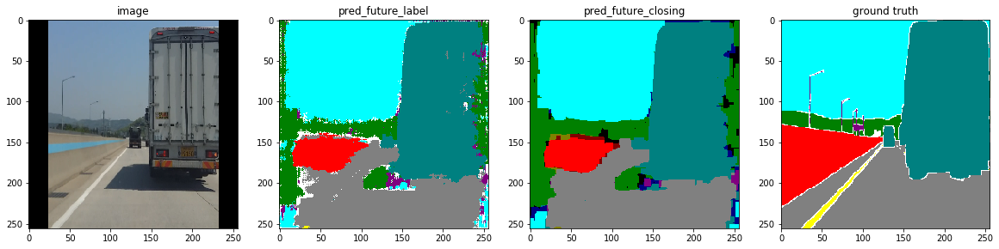

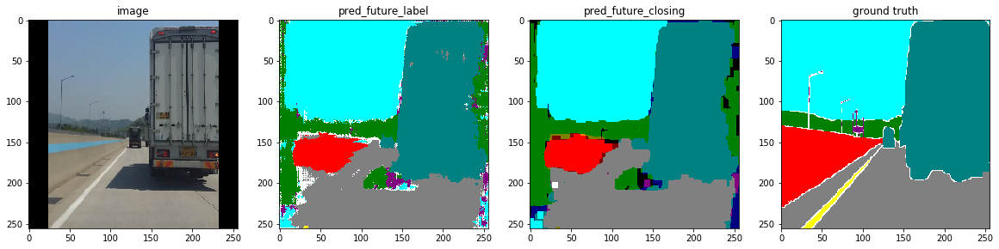

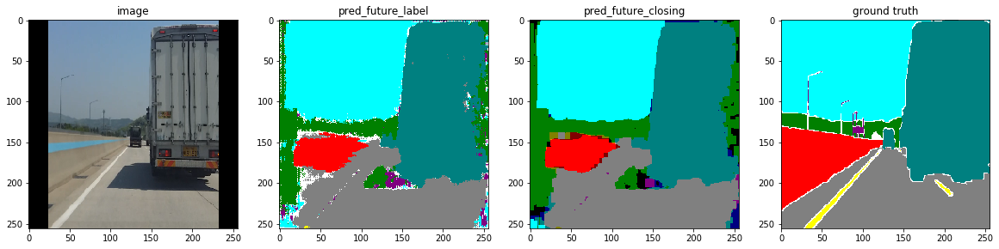

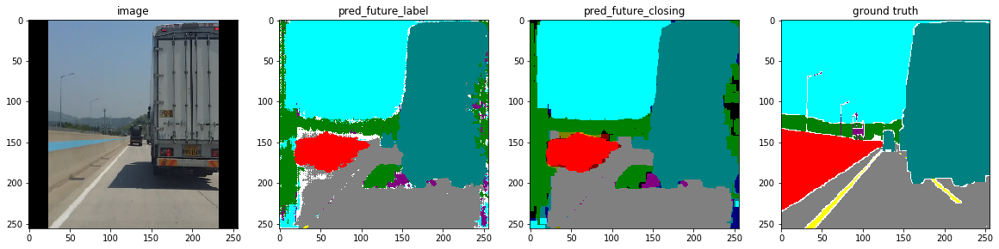

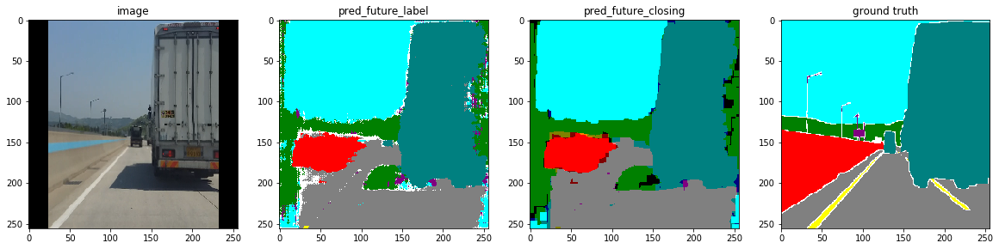

...

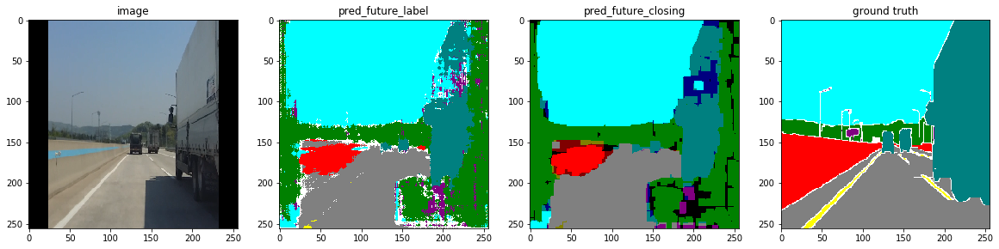

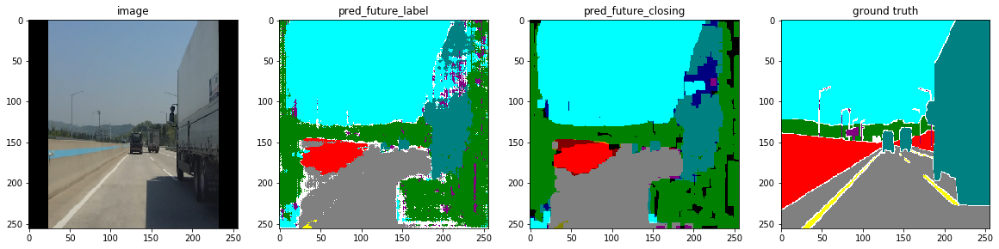

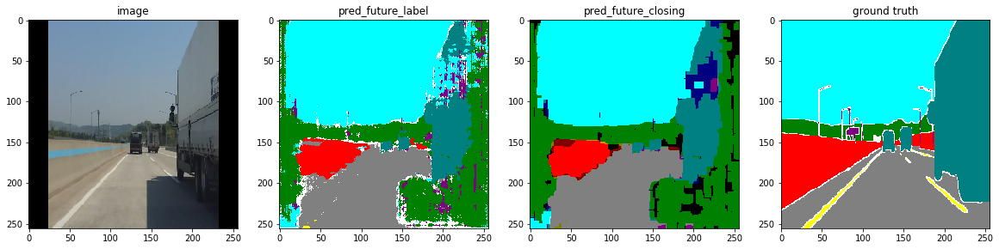

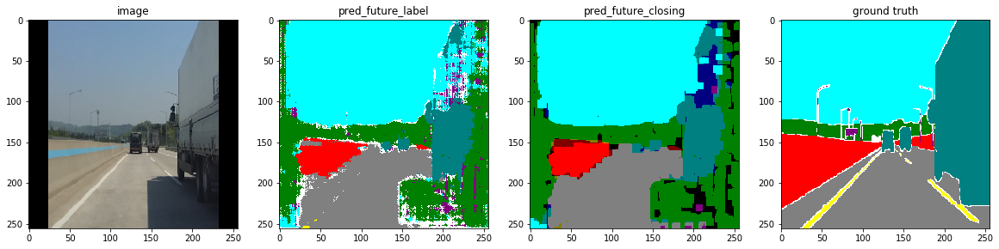

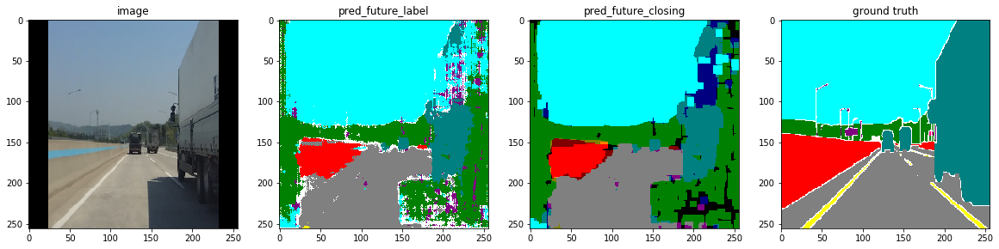

IndexError: index 52 is out of bounds for axis 0 with size 52

In [3]:
#for seq09 with dilation
model = densenet(nb_classes=nb_classes,img_dim=(256,256,3),growth_rate=16)
image = None
image_future = None
label_future = None
model.load_weights("objectPermanence_models/Timestep1Epoch170.h5")
kernel = np.ones((8,8),np.uint8)
for i in range(0,59):
    for x , x_f , l_f in proc.frame2futurelabel_test_datagen(size=(256,256) , batch_size = 60 , time_step = 7 , normalise = True):
        image , image_future , label_future = x[i] , x_f[i] , l_f[i]

        pred_future = model.predict(np.array([image]))
        pred_future_classm = np.argmax(pred_future[0] , axis = -1)
        pred_future_label = proc.class2image(pred_future_classm)
        label_classm = np.argmax(np.array(label_future) , axis = -1)
        label_label = proc.class2image(label_classm)
        image_future = ((np.array(image_future)) * 255).astype(np.uint8)   
        opening = cv2.morphologyEx(pred_future_label, cv2.MORPH_OPEN, kernel)
        
#         side_black=np.copy(opening)
#         middle_black=np.copy(opening)
#         side_black[:,0:24,:] = 0
#         side_black[:,231:256,:] = 0
#         middle_black[:,24:-24,:]= 0
#         closing = cv2.morphologyEx(middle_black, cv2.MORPH_CLOSE, kernel)
#         result=np.bitwise_or(side_black,closing)
        
        plt.figure(figsize=(20, 20))
        plt.subplot(1, 4, 1)
        plt.title("image")
        plt.imshow(image)
        plt.subplot(1,4,2)
        plt.title("pred_future_label")
        plt.imshow(pred_future_label)
        plt.subplot(1,4,3)
        plt.title("pred_future_closing")
        plt.imshow(opening)
        plt.subplot(1,4,4)
        plt.title("ground truth")
        plt.imshow(label_label)
        plt.show()
        
    

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 48) 1344        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 256, 256, 48) 192         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 256, 256, 48) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

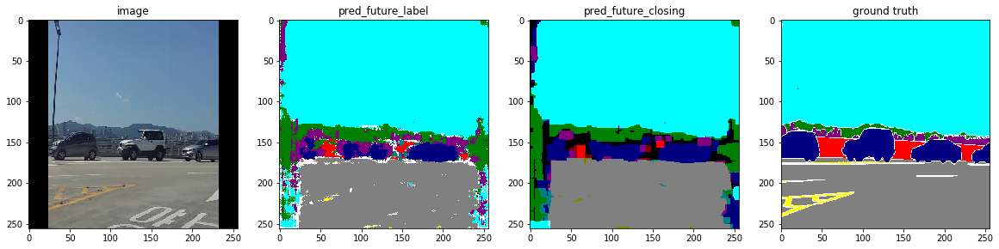

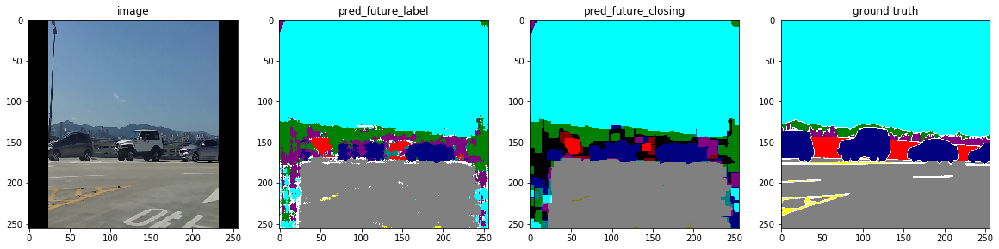

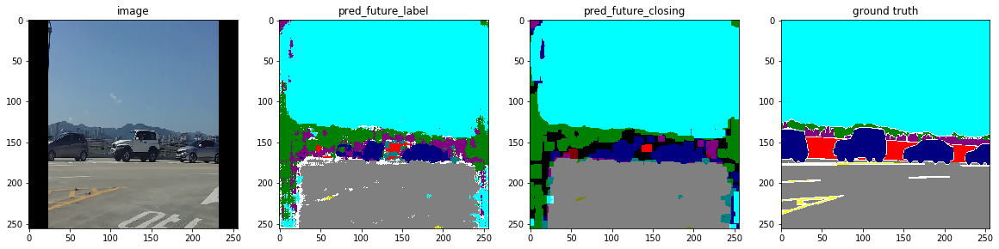

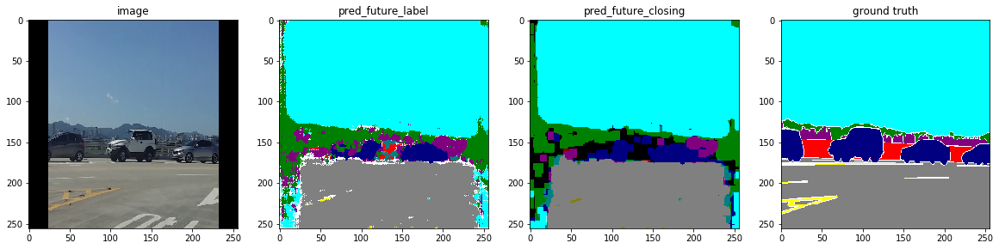

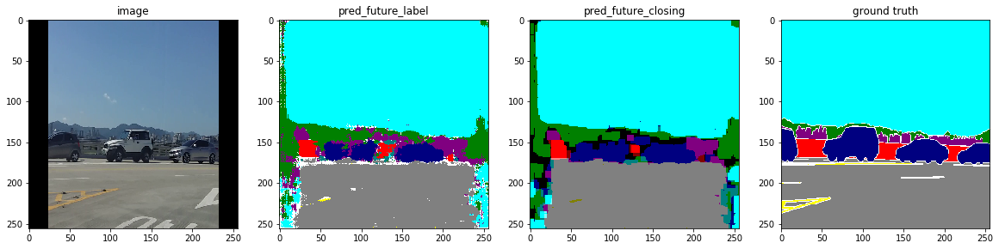

...

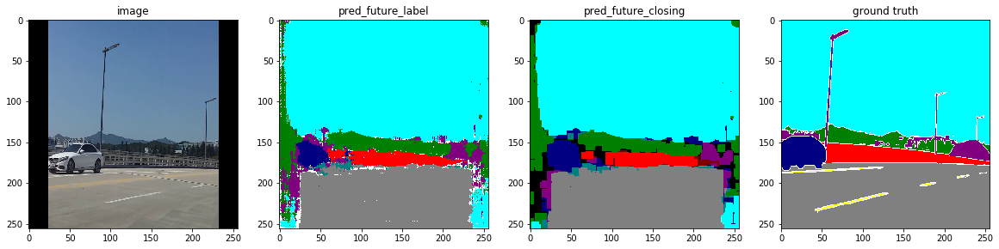

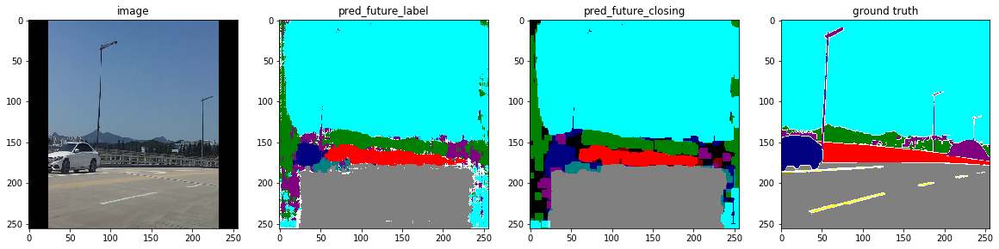

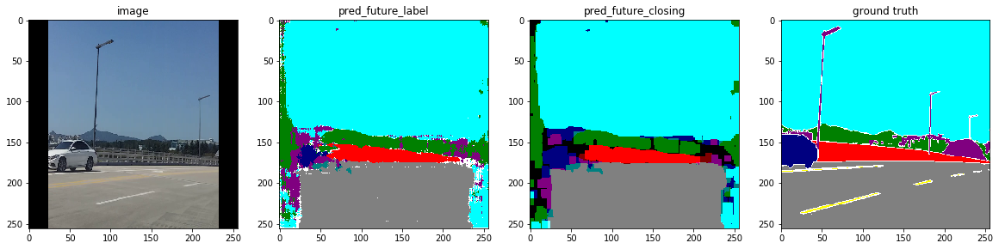

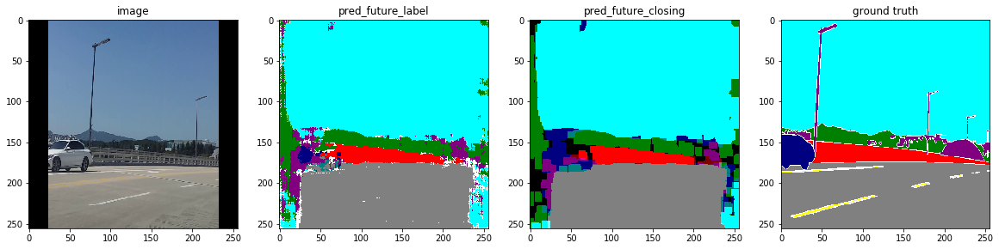

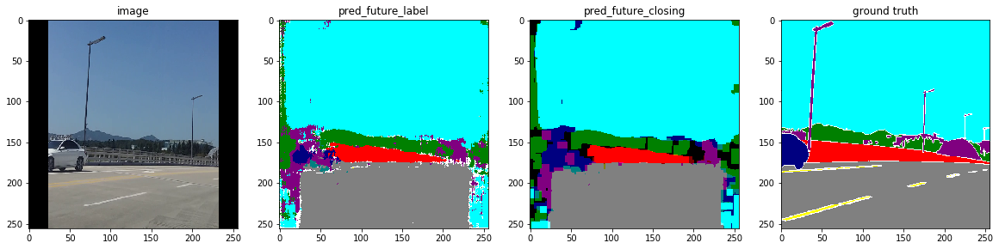

IndexError: index 52 is out of bounds for axis 0 with size 52

In [3]:
#for seq12 with dilation
model = densenet(nb_classes=nb_classes,img_dim=(256,256,3),growth_rate=16)
image = None
image_future = None
label_future = None
model.load_weights("objectPermanence_models/Timestep1Epoch170.h5")
kernel = np.ones((8,8),np.uint8)
for i in range(0,59):
    for x , x_f , l_f in proc.frame2futurelabel_test_datagen(size=(256,256) , batch_size = 60 , time_step = 7 , normalise = True):
        image , image_future , label_future = x[i] , x_f[i] , l_f[i]

        pred_future = model.predict(np.array([image]))
        pred_future_classm = np.argmax(pred_future[0] , axis = -1)
        pred_future_label = proc.class2image(pred_future_classm)
        label_classm = np.argmax(np.array(label_future) , axis = -1)
        label_label = proc.class2image(label_classm)
        image_future = ((np.array(image_future)) * 255).astype(np.uint8)   
        opening = cv2.morphologyEx(pred_future_label, cv2.MORPH_OPEN, kernel)
        
#         side_black=np.copy(opening)
#         middle_black=np.copy(opening)
#         side_black[:,0:24,:] = 0
#         side_black[:,231:256,:] = 0
#         middle_black[:,24:-24,:]= 0
#         closing = cv2.morphologyEx(middle_black, cv2.MORPH_CLOSE, kernel)
#         result=np.bitwise_or(side_black,closing)
        
        plt.figure(figsize=(20, 20))
        plt.subplot(1, 4, 1)
        plt.title("image")
        plt.imshow(image)
        plt.subplot(1,4,2)
        plt.title("pred_future_label")
        plt.imshow(pred_future_label)
        plt.subplot(1,4,3)
        plt.title("pred_future_closing")
        plt.imshow(opening)
        plt.subplot(1,4,4)
        plt.title("ground truth")
        plt.imshow(label_label)
        plt.show()
        
    